In [3]:
import matplotlib.pyplot as plt
from matplotlib.offsetbox import OffsetImage,AnnotationBbox
import pandas as pd
# %matplotlib qt
%matplotlib inline

In [5]:
# Uses code from https://stackoverflow.com/questions/44246650/add-image-annotations-to-bar-plots
def get_flag(name):
    path = f"../data/2022_05/motifs_PNG/{name}.png"
    im = plt.imread(path)
    return im

def offset_image(coord, name, ax):
    img = get_flag(name)
    im = OffsetImage(img, zoom=0.15)
    im.image.axes = ax

    ab = AnnotationBbox(im, (coord, 0),  xybox=(0., -20.), frameon=False,
                        xycoords='data',  boxcoords="offset points", pad=0)

    ax.add_artist(ab)
    
    
def get_values_from_df(game, threshold, delta):
    values = []
    df = pd.read_csv(f"../data/2022_05/motif_counts/count_game{game}_thresh{threshold}_delta{delta}.txt", sep=" ", header=None)
    df.columns = [1,2,3,4,5,6]
    df.index = [1,2,3,4,5,6]
    for row in range(1,7):
        for column in range(1,7):
            values.append(df[column][row])
    return values


def get_labels():
    labels = []
    for row in range(1,7):
        for column in range(1,7):
            labels.append(f'row-{row}-column-{column}')
    return labels

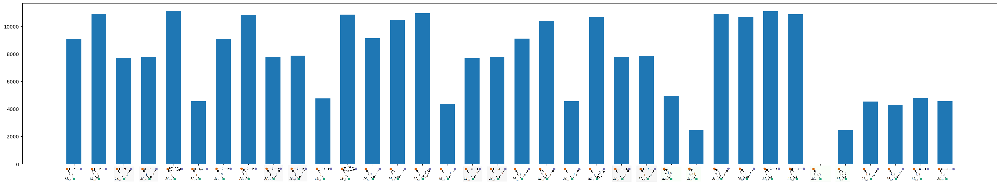

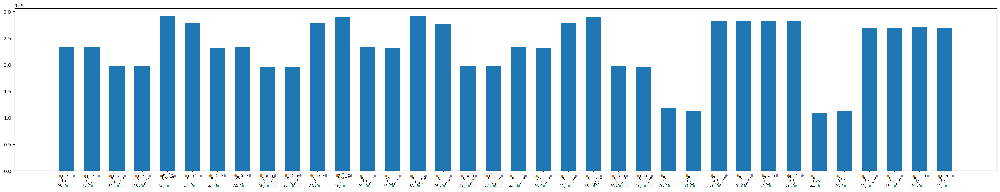

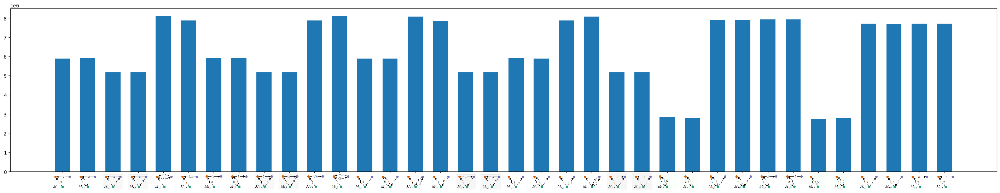

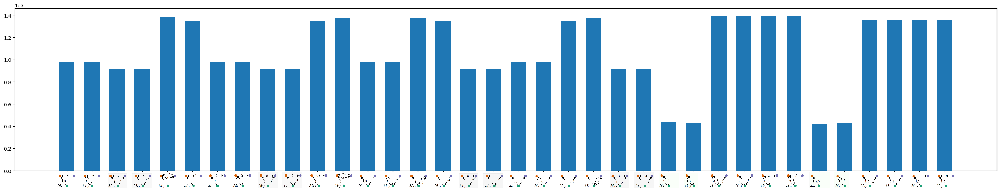

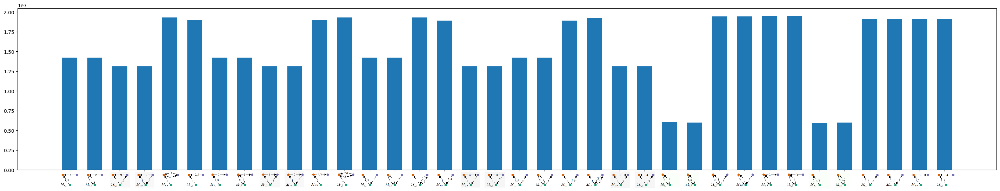

...

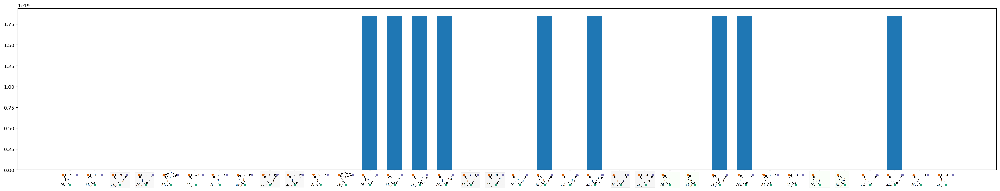

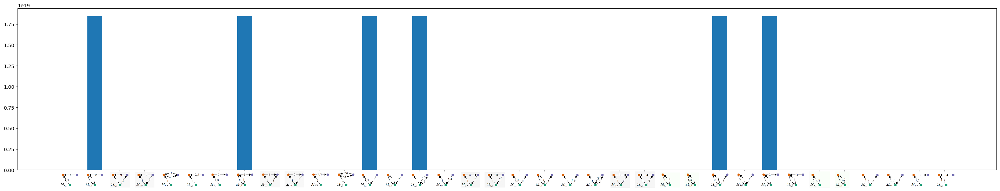

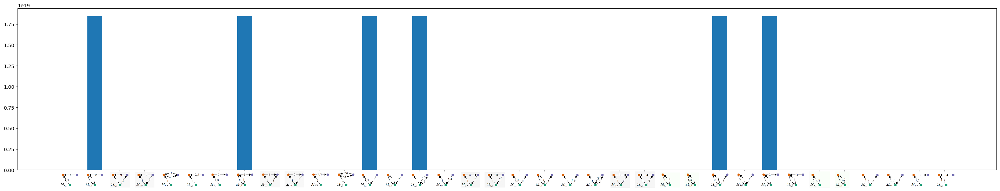

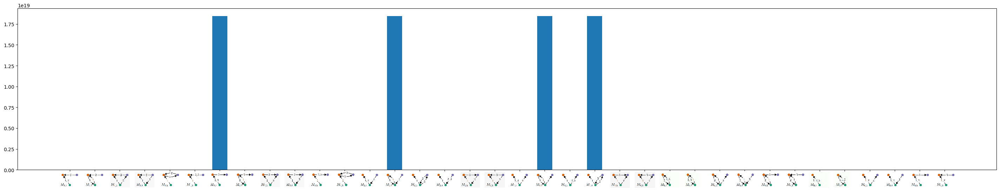

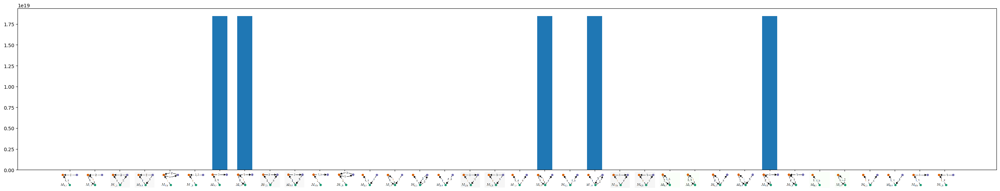

In [6]:
# Affiche le nombre de fois qu'un motif donné apparaît.
# PROBLÈME : le code de snap qui compte les motifs est possiblement pas fiable
for game in range(1,7):
    for threshold in range(5, 26, 5):
        for delta in range(1, 122, 30):
            values = get_values_from_df(game, threshold, delta)
            labels = get_labels()

            fig, ax = plt.subplots(figsize=(36,6))

            ax.bar(range(len(values)), values, width=0.6 ,align="center")
            ax.set_xticks(range(len(values)))
            ax.set_xticklabels(labels)
            ax.tick_params(axis='x', which='major', pad=26)

            for i, c in enumerate(labels):
                offset_image(i, c, ax)

            ax.set_xticklabels([])
            plt.show()
#             plt.savefig(f'temporal_motifs_counts/game{game}_thresh{threshold}_delta{delta}.pdf', bbox_inches='tight')
            plt.close()